#### Importing Libraries

In [1]:
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt

#### Setup

In [2]:
n_rows = 6
n_cols = 9

In [3]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

In [4]:
# Vectors for storing 3D points and corresponding 2D points for each checkerboard image
objectPoints = []
imagePoints = []

In [5]:
# Defining the world coordinates for the 3D points
objectCoordinates = np.zeros((1, n_rows * n_cols, 3), np.float32)
objectCoordinates[0, :, :2] = np.mgrid[0:n_rows, 0:n_cols].T.reshape(-1, 2)

In [6]:
# Extracting path of individual image stored in a given directory
images = glob.glob('./CV_images/*.jpg')

#### Finding checkerboard corners

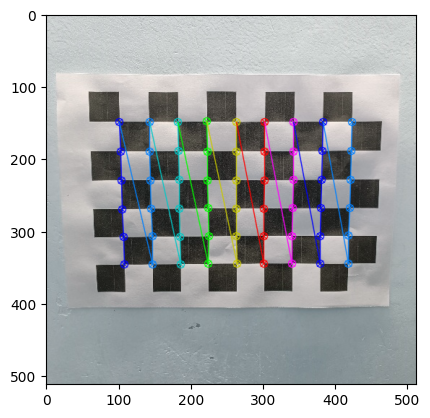

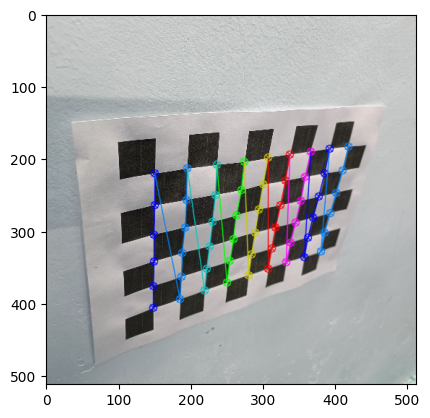

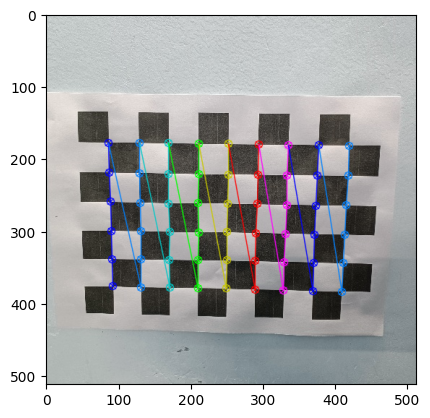

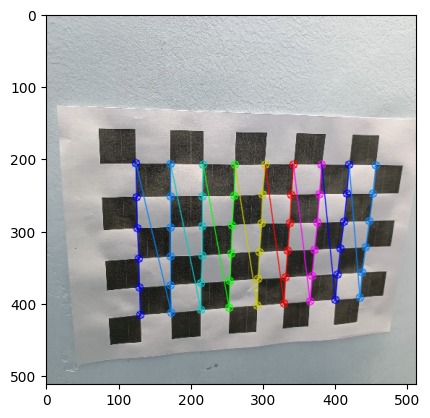

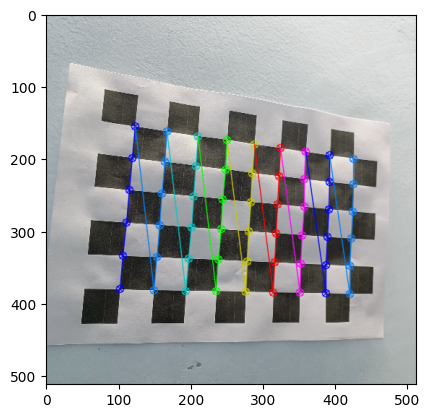

...

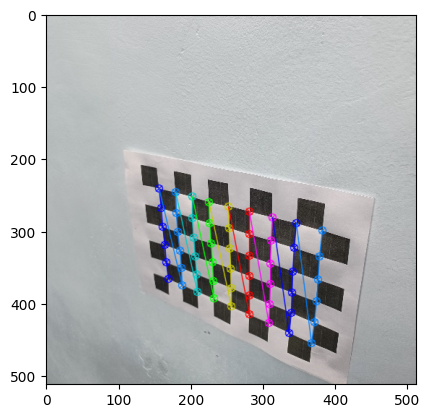

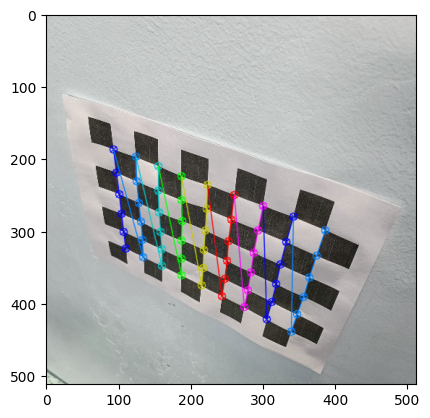

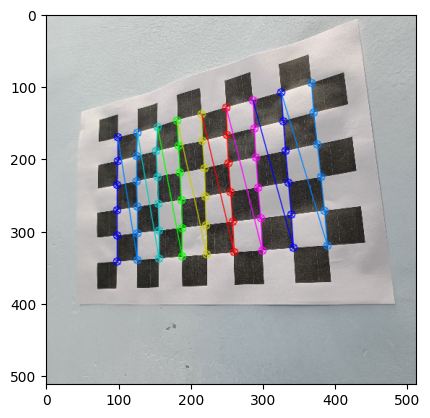

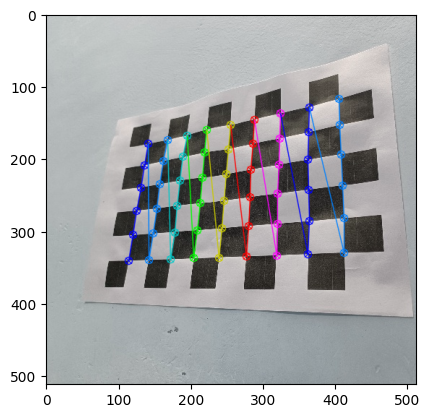

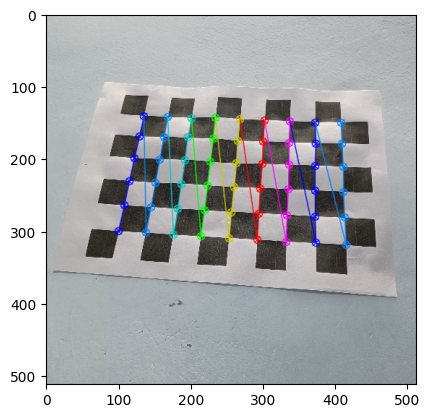

In [7]:
for img in images:
    image = cv2.imread(img)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Find the chess board corners
    returnValue, corners = cv2.findChessboardCorners(gray, (n_rows, n_cols), cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
    if returnValue == True:
        objectPoints.append(objectCoordinates)
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imagePoints.append(corners2)
        image = cv2.drawChessboardCorners(image, (n_rows, n_cols), corners2, returnValue)
        plt.imshow(image)
        plt.show()

#### Camera Calibration

In [8]:
# Calibrating the camera
reprojectionError, cameraMatrix, distorsionCoefficients, rotationVectors, translationVectors = cv2.calibrateCamera(objectPoints, imagePoints, gray.shape[::-1], None, None)

#### Part 1: Reporting estimated intrinsic camera parameters

In [36]:
# Intrinsic camera parameters
print("Camera Matrix: \n", cameraMatrix)
print("Focal Length (fx, fy): ", (cameraMatrix[0, 0], cameraMatrix[1, 1]))
print("Principal Point (cx, cy): ", (cameraMatrix[0, 2], cameraMatrix[1, 2]))
print("Skew Coefficient: ", cameraMatrix[0, 1])
print("Distorsion Coefficients: ", distorsionCoefficients.ravel())
print("Mean Reprojection Error: ", reprojectionError)

Camera Matrix: 
 [[485.40629819   0.         262.5051723 ]
 [  0.         487.04652074 262.54720001]
 [  0.           0.           1.        ]]
Focal Length (fx, fy):  (485.406298185692, 487.0465207409381)
Principal Point (cx, cy):  (262.5051722983334, 262.54720001202196)
Skew Coefficient:  0.0
Distorsion Coefficients:  [ 2.95175621e-01 -2.30374358e+00  1.72739831e-03  3.41344935e-03
  5.58612187e+00]
Mean Reprojection Error:  1.0201390429906425


#### Part 2: Reporting estimated extrinsic camera parameters for each image

In [38]:
# Extrinsic camera parameters
for i in range(len(images)):
    print("Image ", i)
    print("Rotation Vector: ", rotationVectors[i].flatten())
    print("Translation Vector: ", translationVectors[i].flatten())

Image  0
Rotation Vector:  [ 0.09560065  0.07129398 -1.57219482]
Translation Vector:  [-3.98521945  2.15749286 12.67382097]
Image  1
Rotation Vector:  [ 0.86920417 -0.06668269 -1.51535309]
Translation Vector:  [-2.81548126  3.53493994 12.08760974]
Image  2
Rotation Vector:  [ 0.0946836   0.11150948 -1.55285579]
Translation Vector:  [-4.33033001  2.89817386 12.49048132]
Image  3
Rotation Vector:  [ 0.36390107  0.01982289 -1.54643838]
Translation Vector:  [-3.15682772  3.6522204  11.7287868 ]
Image  4
Rotation Vector:  [ 0.17140174 -0.2963308  -1.47982473]
Translation Vector:  [-3.48859834  2.55248936 10.64611649]
Image  5
Rotation Vector:  [-0.23149146 -0.08731194 -1.54061736]
Translation Vector:  [-4.36328633  1.84546473 11.27818543]
Image  6
Rotation Vector:  [ 0.18524243  0.25792458 -1.53091255]
Translation Vector:  [-4.15596307  4.18196673 13.4763175 ]
Image  7
Rotation Vector:  [ 0.08700205  0.01405954 -1.5586453 ]
Translation Vector:  [-3.89847577  3.29187977 12.25943124]
Image  8

#### Part 3: Reporting estimated distortion parameters and undistorting images

In [68]:
print("Radial Distortion Coefficients: ", distorsionCoefficients[0:2])

Radial Distortion Coefficients:  [[ 2.95175621e-01 -2.30374358e+00  1.72739831e-03  3.41344935e-03
   5.58612187e+00]]


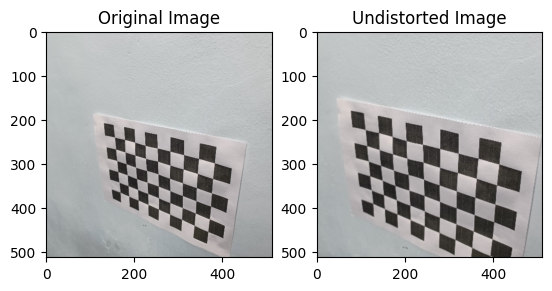

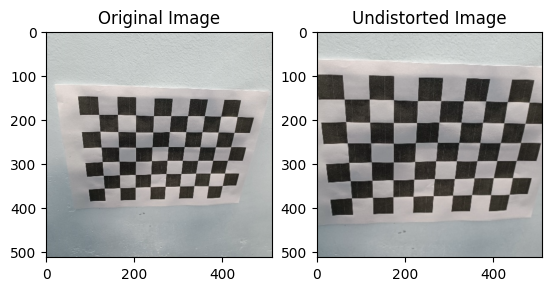

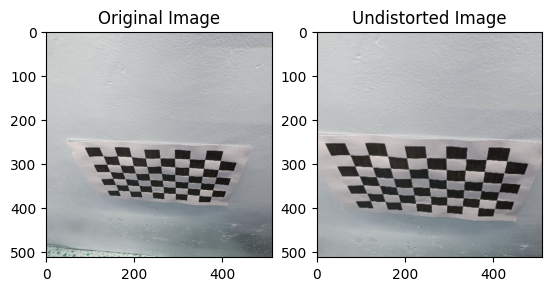

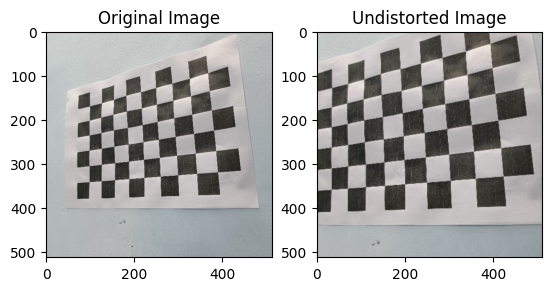

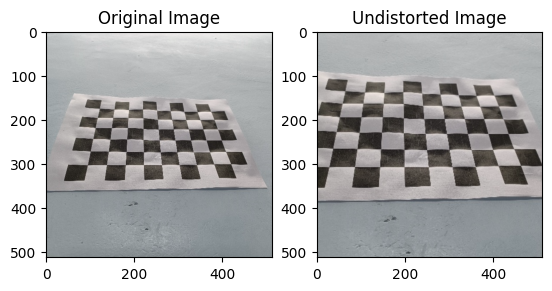

In [67]:
# Distorting images using radial distortion coefficients
random_images = np.random.choice(images, 5)
for i in range(5):
    image = cv2.imread(random_images[i])
    height, width = image.shape[:2]
    newCameraMatrix, roi = cv2.getOptimalNewCameraMatrix(cameraMatrix, distorsionCoefficients, (width, height), 0, (width, height))
    undistortedImage = cv2.undistort(image, cameraMatrix, distorsionCoefficients, None, newCameraMatrix)
    # Subplot for original image
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    # Subplot for undistorted image
    plt.subplot(1, 2, 2)
    plt.imshow(undistortedImage)
    plt.title("Undistorted Image")
    plt.show()

#### Part 4: Reporting re-projection error for each image and plotting results

In [47]:
# Computing the reprojection error for each image using the estimated intrinsic and extrinsic camera parameters
overallError = 0
errors = []
for i in range(len(objectPoints)):
    imagePoints2, _ = cv2.projectPoints(objectPoints[i], rotationVectors[i], translationVectors[i], cameraMatrix, distorsionCoefficients)
    error = cv2.norm(imagePoints[i], imagePoints2, cv2.NORM_L2) / len(imagePoints2)
    overallError += error
    errors.append(error)
    print("Reprojection Error for Image", i, ": ", error)

Reprojection Error for Image 0 :  0.05840403190094309
Reprojection Error for Image 1 :  0.11689671199278649
Reprojection Error for Image 2 :  0.05868370202225279
Reprojection Error for Image 3 :  0.07738909831699038
Reprojection Error for Image 4 :  0.06607172535422497
Reprojection Error for Image 5 :  0.07103060623981218
Reprojection Error for Image 6 :  0.08103985892621121
Reprojection Error for Image 7 :  0.05835918981508332
Reprojection Error for Image 8 :  0.1251031858314579
Reprojection Error for Image 9 :  0.131698485076388
Reprojection Error for Image 10 :  0.13938404579038924
Reprojection Error for Image 11 :  0.0864790686903139
Reprojection Error for Image 12 :  0.0988447416942954
Reprojection Error for Image 13 :  0.13227185535604305
Reprojection Error for Image 14 :  0.1513022848315769
Reprojection Error for Image 15 :  0.13374579822568314
Reprojection Error for Image 16 :  0.12560198690876934
Reprojection Error for Image 17 :  0.4997915466248572
Reprojection Error for Imag

In [53]:
meanError = overallError / len(objectPoints)
standardDeviation = np.std(errors)
print("Mean Reprojection Error: ", meanError)
print("Standard Deviation of Reprojection Error: ", standardDeviation)

Mean Reprojection Error:  0.11425469985124591
Standard Deviation of Reprojection Error:  0.07885290861335865


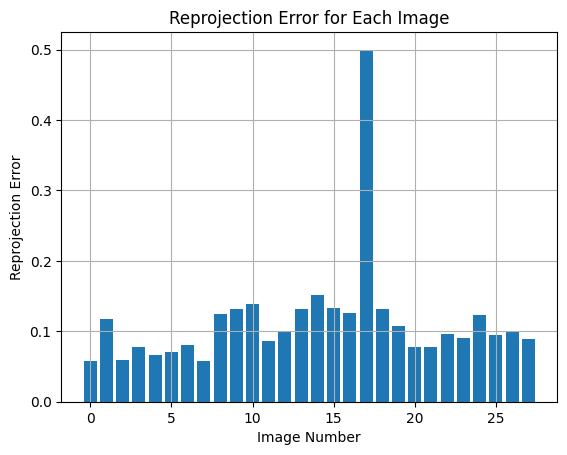

In [54]:
# plot the error using a bar chart
plt.bar(range(len(errors)), errors)
plt.xlabel("Image Number")
plt.ylabel("Reprojection Error")
plt.title("Reprojection Error for Each Image")
plt.grid()
plt.show()

#### Part 5: Plotting of corners detection on images before and after re-projection

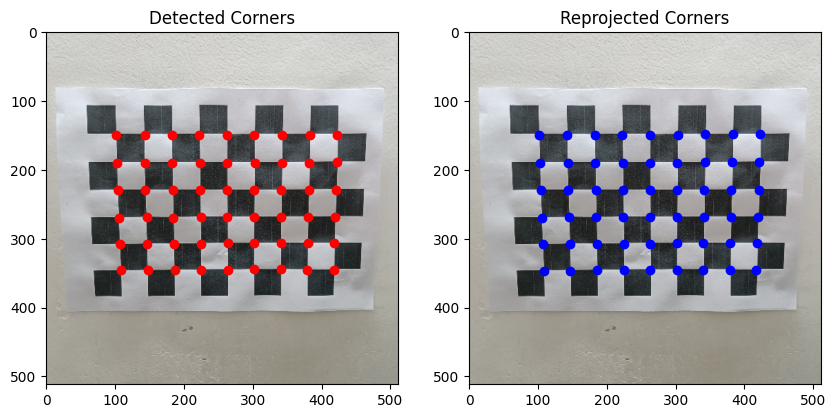

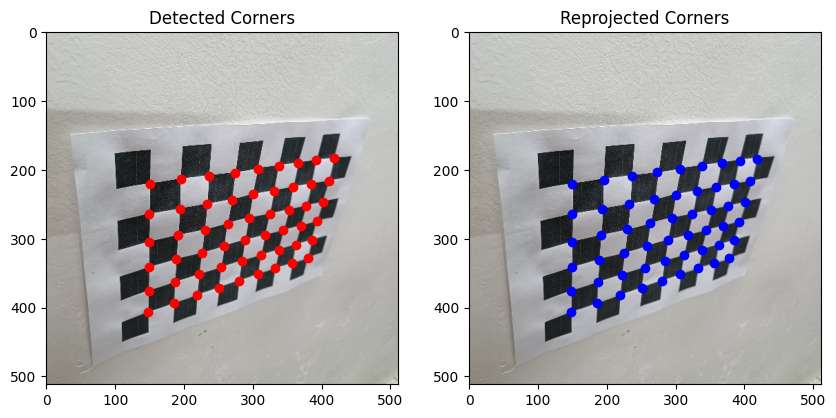

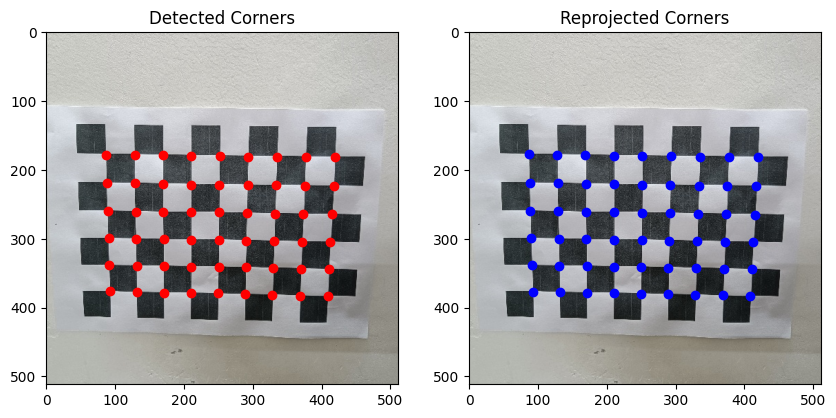

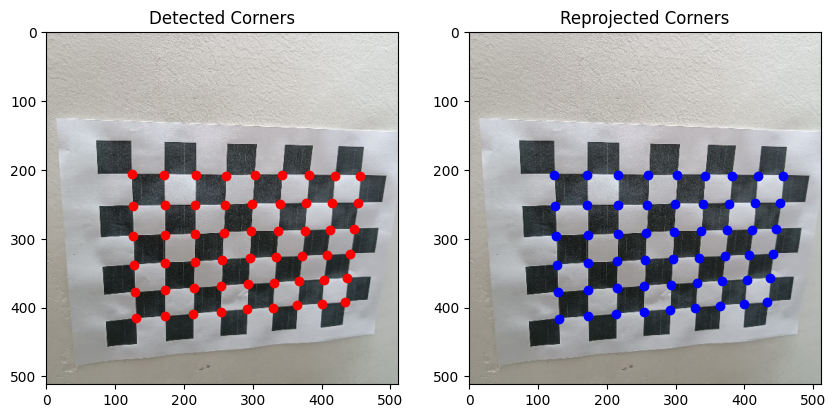

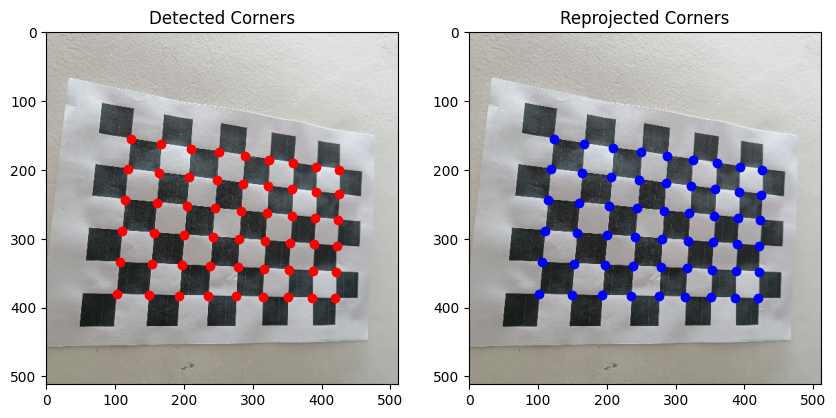

...

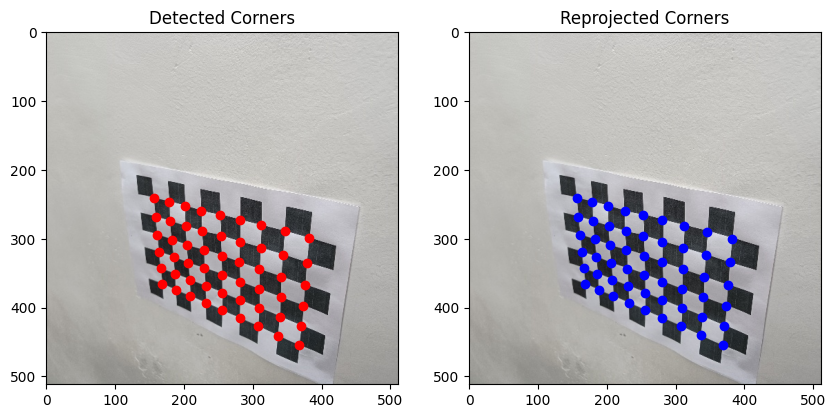

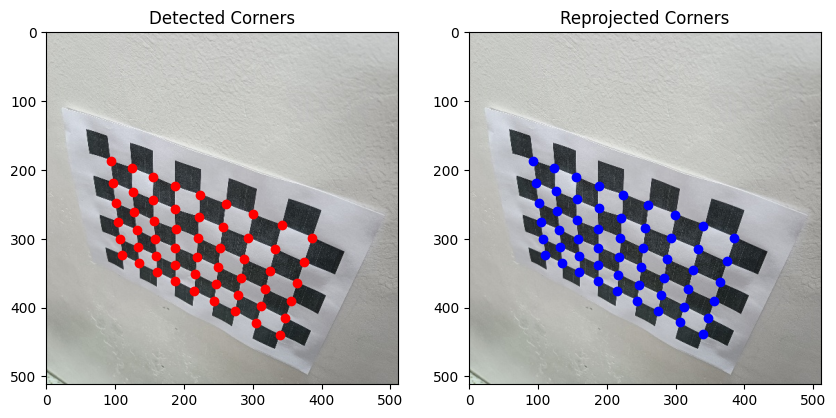

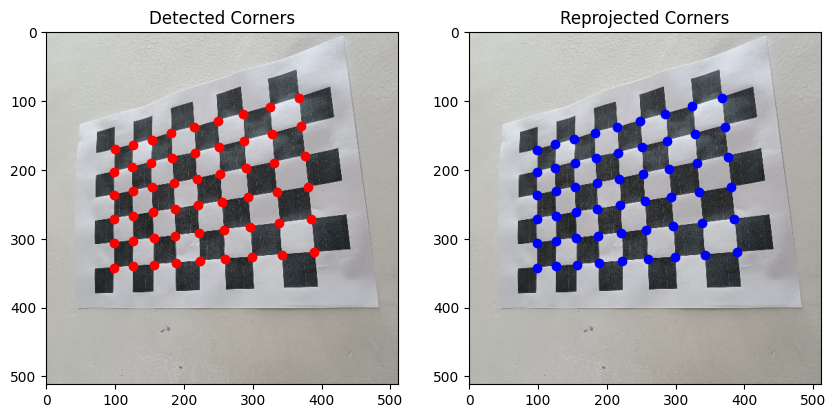

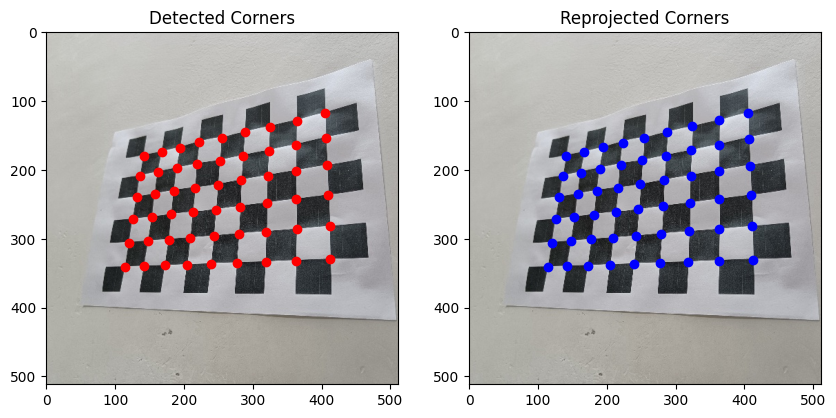

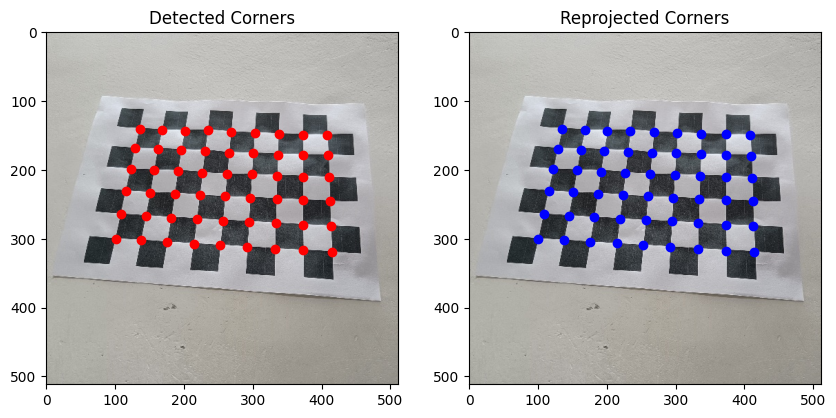

In [63]:
# Iterate through each image
for i in range(len(images)):
    image = cv2.imread(images[i])
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Detect chessboard corners
    returnValue, corners = cv2.findChessboardCorners(gray, (n_rows, n_cols), cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
    if returnValue == True:
        # Refining corner locations
        corners_refined = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        # Project corners onto image plane using camera parameters
        projected_points, _ = cv2.projectPoints(objectCoordinates, rotationVectors[i], translationVectors[i], cameraMatrix, distorsionCoefficients)
        # Subplot for detected corners
        plt.figure(figsize=(10, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Detected Corners')
        plt.scatter(corners_refined[:, 0, 0], corners_refined[:, 0, 1], c='red')
        # Subplot for reprojection of corners
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Reprojected Corners')
        plt.scatter(projected_points[:, 0, 0], projected_points[:, 0, 1], c='blue')
        plt.show()


#### Part 6: Reporting checkerboard plane normals for each image

In [62]:
# Assuming the checkerboard lies in the XY plane of the world coordinate frame
normal_world = np.array([[0], [0], [1]])
plane_normals = []
for i in range(len(rotationVectors)):
    # Using Rodrigues' formula to find rotation matrix
    R, _ = cv2.Rodrigues(rotationVectors[i])
    # Transforming the normal vector to the camera coordinate frame using the rotation matrix
    normal_camera = np.dot(R, normal_world)
    plane_normals.append(normal_camera)
plane_normals = np.array(plane_normals)
for i in range(len(plane_normals)):
    print(f"Image {i}: Checkerboard Plane Normal (in Camera Coordinate Frame):\n{plane_normals[i].flatten()}")

Image 0: Checkerboard Plane Normal (in Camera Coordinate Frame):
[-0.01560078 -0.10598594  0.99424524]
Image 1: Checkerboard Plane Normal (in Camera Coordinate Frame):
[-0.54457481 -0.45049254  0.70745654]
Image 2: Checkerboard Plane Normal (in Camera Coordinate Frame):
[ 0.01171964 -0.13109141  0.99130101]
Image 3: Checkerboard Plane Normal (in Camera Coordinate Frame):
[-0.21447336 -0.24136679  0.94643714]
Image 4: Checkerboard Plane Normal (in Camera Coordinate Frame):
[-0.29907212  0.06752283  0.9518385 ]
Image 5: Checkerboard Plane Normal (in Camera Coordinate Frame):
[0.0889987  0.2030217  0.97512123]
Image 6: Checkerboard Plane Normal (in Camera Coordinate Frame):
[ 0.04979827 -0.27882541  0.9590498 ]
Image 7: Checkerboard Plane Normal (in Camera Coordinate Frame):
[-0.04609801 -0.06463214  0.99684385]
Image 8: Checkerboard Plane Normal (in Camera Coordinate Frame):
[ 0.50533174 -0.4845893   0.71401193]
Image 9: Checkerboard Plane Normal (in Camera Coordinate Frame):
[-0.5612525